# **Airbnb Veriseti ile EDA İşlemleri**

In [1]:
#Gerekli kütüphanelerin yüklenmesi
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
import missingno as msno
warnings.filterwarnings('ignore')
#pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 500)


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
df = pd.read_csv('/kaggle/input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
df.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2
48894,36487245,Trendy duplex in the very heart of Hell's Kitchen,68119814,Christophe,Manhattan,Hell's Kitchen,40.76404,-73.98933,Private room,90,7,0,NaN,NaN,1,23


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
df.shape

(48895, 16)

In [6]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365'], dtype='object')

In [7]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [8]:
#pandas profiling ile verisetine genel bakış
import pandas_profiling
profile = pandas_profiling.ProfileReport(df)
profile.to_file(output_file='Airbnb.html')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Değişken Türlerinin İncelenmesi # 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [10]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


**Değişken Türlerinin Düzenlenmesi**

In [11]:
#int to object
df["host_id"]=df["host_id"].astype(object)
df["host_id"].dtype

dtype('O')

In [12]:
#en çok kayda sahip olan ve bu hizmetten faydalanan ev sahipleri
df["host_id"].value_counts().nlargest(3)
#df["host_id"].value_counts()head(3)


219517861    327
107434423    232
30283594     121
Name: host_id, dtype: int64

In [13]:
#object to datetime
df['last_review'] = df['last_review'].apply(lambda x: pd.to_datetime(x))
df['last_review'].dtype.name

'datetime64[ns]'

In [14]:
df['last_review'].head()

0   2018-10-19
1   2019-05-21
2          NaT
3   2019-07-05
4   2018-11-19
Name: last_review, dtype: datetime64[ns]

**Tarih Değişkeninden Yeni Değişkenler Türetilmesi**

In [15]:
df['day_of_week'] = df.last_review.dt.dayofweek
df['day_of_week'].head()

0    4.0
1    1.0
2    NaN
3    4.0
4    0.0
Name: day_of_week, dtype: float64

In [16]:
df['last_review'].head()

0   2018-10-19
1   2019-05-21
2          NaT
3   2019-07-05
4   2018-11-19
Name: last_review, dtype: datetime64[ns]

In [17]:
df["is_weekend"] = df.last_review.dt.weekday // 4
df["is_weekend"].head()

0    1.0
1    0.0
2    NaN
3    1.0
4    0.0
Name: is_weekend, dtype: float64

**Bazı Gözlemlerin Silinmesi**

In [18]:
#price 0 olan değişkenleri gözlemliyoruz. Sıfır değerleri yapısal bir yanlışlıktan ötürü olabilir.
df[df['price']==0]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28,5.0,1.0
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127,0.0,0.0
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0,5.0,1.0
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0,4.0,1.0
25778,20624541,Modern apartment in the heart of Williamsburg,10132166,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,2018-01-02,0.15,1,73,1.0,0.0
25794,20639628,Spacious comfortable master bedroom with nice ...,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,0,1,93,2019-06-15,4.28,6,176,5.0,1.0
25795,20639792,Contemporary bedroom in brownstone with nice view,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0,1,95,2019-06-21,4.37,6,232,4.0,1.0
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222,6.0,1.0
26259,20933849,the best you can find,13709292,Qiuchi,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,0,3,0,NaT,NaN,1,0,NaN,NaN
26841,21291569,Coliving in Brooklyn! Modern design / Shared room,101970559,Sergii,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0,30,2,2019-06-22,0.11,6,333,5.0,1.0


In [19]:
#bu yüzden price'ı 0'a eşit olan gözlem değerleri silinebilir
#df.drop(df[df['price']==0].index,inplace=True)

In [20]:
#benzer şekilde uygunluğu 0 olanlar ve min night ı 1 yıldan fazla olanları silebiliriz.
#df.drop(df[df['availability_365']==0].index,inplace=True)
#df.drop(df[df.minimum_nights >365].index, inplace=True)

**List Comphrension Yapısı ile Kategorik ve Nümerik Değişkenlerin Yakalanması**

In [21]:
cat_cols = [col for col in df.columns if df[col].dtypes == "O"]
cat_cols

['name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'room_type']

In [22]:
num_cols = [col for col in df.columns if df[col].dtypes != "O" and "last_review" not in col]
num_cols

['id',
 'latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'day_of_week',
 'is_weekend']

 # Eksik Değer Analizi

In [23]:
df.isnull().any()

id                                False
name                               True
host_id                           False
host_name                          True
neighbourhood_group               False
neighbourhood                     False
latitude                          False
longitude                         False
room_type                         False
price                             False
minimum_nights                    False
number_of_reviews                 False
last_review                        True
reviews_per_month                  True
calculated_host_listings_count    False
availability_365                  False
day_of_week                        True
is_weekend                         True
dtype: bool

In [24]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
day_of_week                       10052
is_weekend                        10052
dtype: int64

In [25]:
#na_columns
na_columns = [col for col in df.columns if df[col].isnull().sum() > 0]

In [26]:
#n_miss_ratio
n_miss_ratio = (df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
n_miss_ratio

last_review          20.558339
reviews_per_month    20.558339
day_of_week          20.558339
is_weekend           20.558339
host_name             0.042949
name                  0.032723
dtype: float64

In [27]:
np.round((df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False), 2)

last_review          20.56
reviews_per_month    20.56
day_of_week          20.56
is_weekend           20.56
host_name             0.04
name                  0.03
dtype: float64

In [28]:
np.round(n_miss_ratio, 2)

last_review          20.56
reviews_per_month    20.56
day_of_week          20.56
is_weekend           20.56
host_name             0.04
name                  0.03
dtype: float64

**Eksik değerlerin görselleştirilmesi**

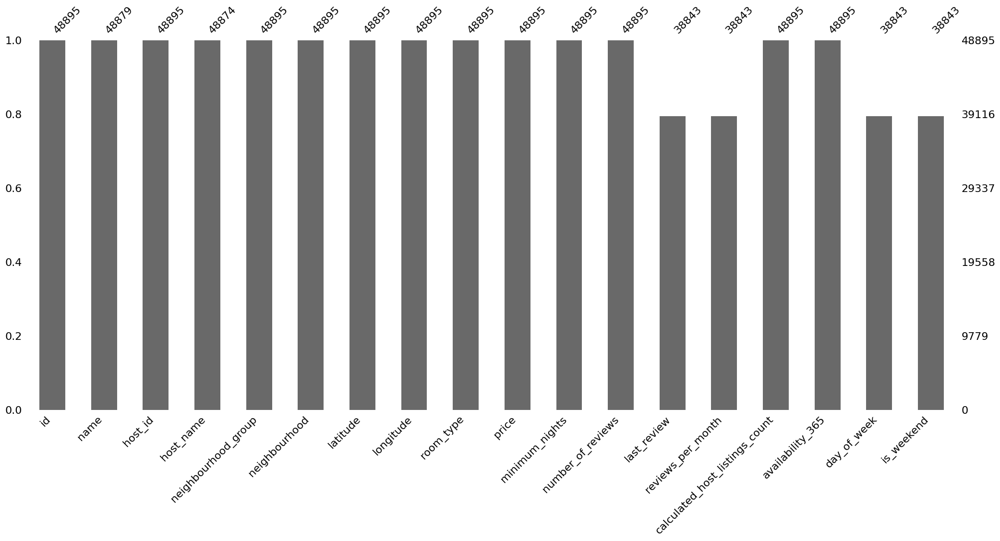

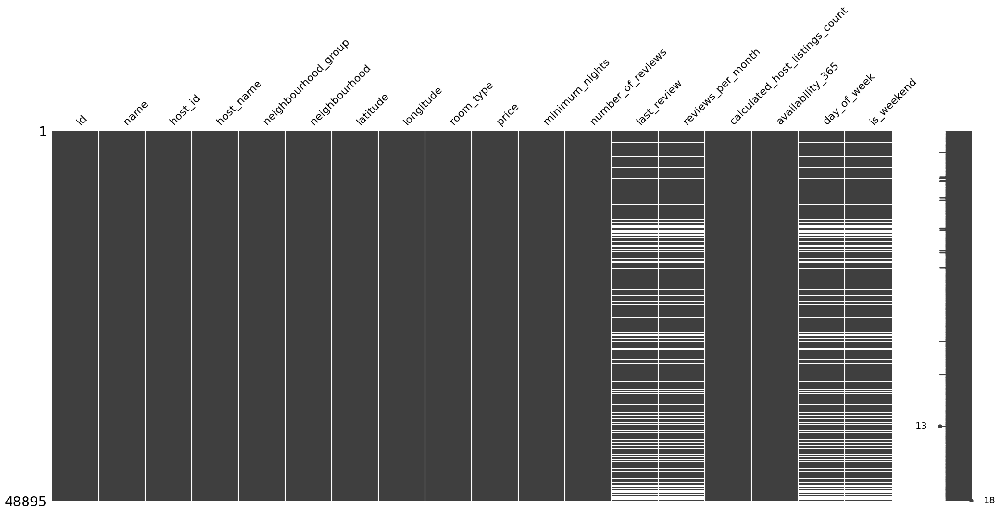

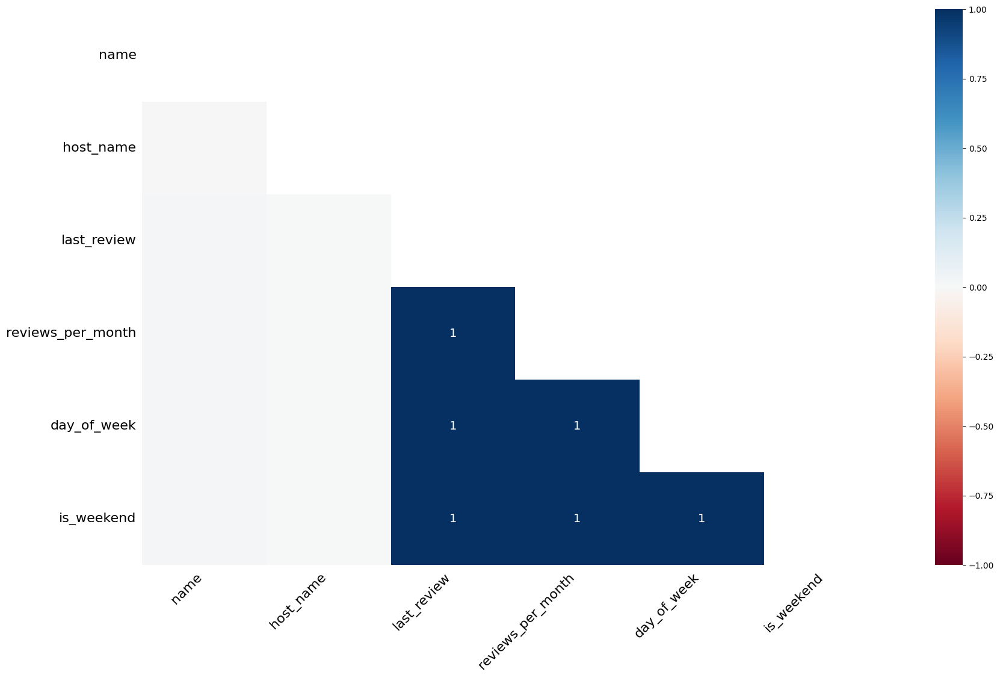

In [29]:
msno.bar(df)
plt.show()

msno.matrix(df)
plt.show()

msno.heatmap(df)
plt.show()


**Eksik değerlerle başa çıkma**

In [30]:
#Yöntem 1. Eksik değerler verisetinden silinebilir.
#df.dropna()

In [31]:
#Yöntem 2. Herhangi bir değerle doldurulabilir.
df["number_of_reviews"].fillna(0)

0          9
1         45
2          0
3        270
4          9
        ... 
48890      0
48891      0
48892      0
48893      0
48894      0
Name: number_of_reviews, Length: 48895, dtype: int64

In [32]:
#ortalama ile doldurma
df["number_of_reviews"].fillna(df["number_of_reviews"].mean())

0          9
1         45
2          0
3        270
4          9
        ... 
48890      0
48891      0
48892      0
48893      0
48894      0
Name: number_of_reviews, Length: 48895, dtype: int64

In [33]:
#median ile doldurma
df["number_of_reviews"].fillna(df["number_of_reviews"].median())

0          9
1         45
2          0
3        270
4          9
        ... 
48890      0
48891      0
48892      0
48893      0
48894      0
Name: number_of_reviews, Length: 48895, dtype: int64

In [34]:
#null değerleri ortalama ile doldur(object değişken varsa çalışmaz)
#df.apply(lambda x: x.fillna(x.mean()), axis=0)

In [35]:
#tipi object olmayanları ortalama ile doldur, obejct olanlar aynı kalsın
#df.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0).head()

#kaydetmek için dff
#df.reviews_per_month.fillna(0, inplace=True)
#dff = df.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0)

In [36]:
#tipi object olanlar mode ile doldurulmalıdır. 

df["host_name"].fillna(df["host_name"].mode())
df["name"].fillna(df["name"].mode())

0                       Clean & quiet apt home by the park
1                                    Skylit Midtown Castle
2                      THE VILLAGE OF HARLEM....NEW YORK !
3                          Cozy Entire Floor of Brownstone
4         Entire Apt: Spacious Studio/Loft by central park
                               ...                        
48890      Charming one bedroom - newly renovated rowhouse
48891        Affordable room in Bushwick/East Williamsburg
48892              Sunny Studio at Historical Neighborhood
48893                 43rd St. Time Square-cozy single bed
48894    Trendy duplex in the very heart of Hell's Kitchen
Name: name, Length: 48895, dtype: object

In [37]:
#Yöntem 3. scikitlearn aracılığıyla eksik değerleri doldurulabilir.
#from sklearn.impute import SimpleImputer
#imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
#imp_mean.fit(df)
#imp_mean.transform(df)

In [38]:
#Yöntem 4. Eğer price değişkeninde eksik değer olsaydı bölgeye göre price ort. ile doldurabilirdik.
df.groupby("neighbourhood_group")["price"].mean()

neighbourhood_group
Bronx             87.496792
Brooklyn         124.383207
Manhattan        196.875814
Queens            99.517649
Staten Island    114.812332
Name: price, dtype: float64

In [39]:
#eksik değerleri bölgeye göre groupby a alıp price ortalamaları ile değiştirme
#df["price"].fillna(df.groupby("neighbourhood_group")["price"].transform("mean"))

# Aykırı Değer Analizi

In [40]:
#aykırı değerler için kartillerin belirlenmesi
q1 = df["price"].quantile(0.25)
q3 = df["price"].quantile(0.75)
iqr = q3 - q1
up = q3 + 1.5 * iqr
low = q1 - 1.5 * iqr

In [41]:
#aykırı değerlerin tespiti
df[(df["price"] > up) | (df["price"] < low)].any(axis=None)

True

In [42]:
#aykırı değerlerin alt ve üst limitlerle baskılanması
#df.loc[(df["price"] > up), "price"] = up
#df.loc[(df["price"] < low), "price"] = low

# Görselleştirmeler ve Çeşitli İçgörüler

id
Skew : -0.09


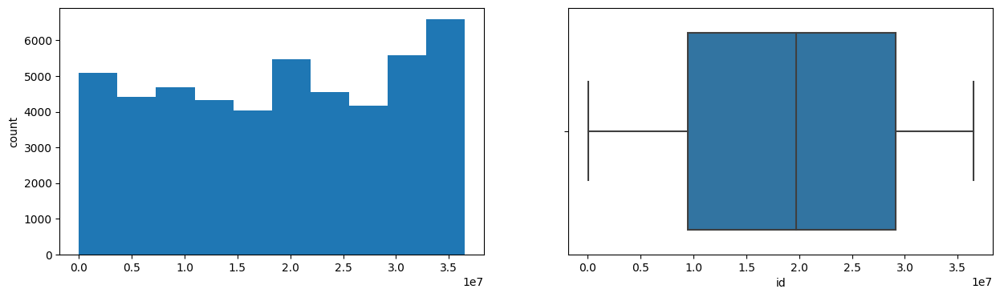

latitude
Skew : 0.24


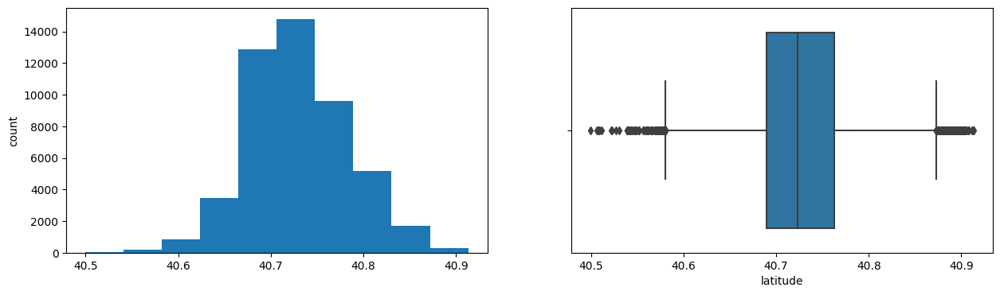

longitude
Skew : 1.28


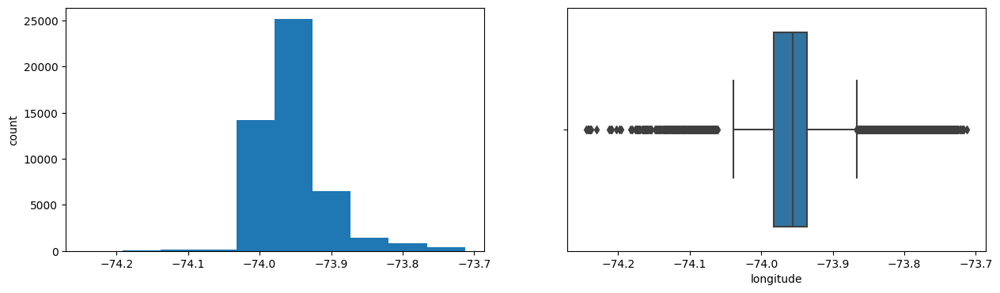

price
Skew : 19.12


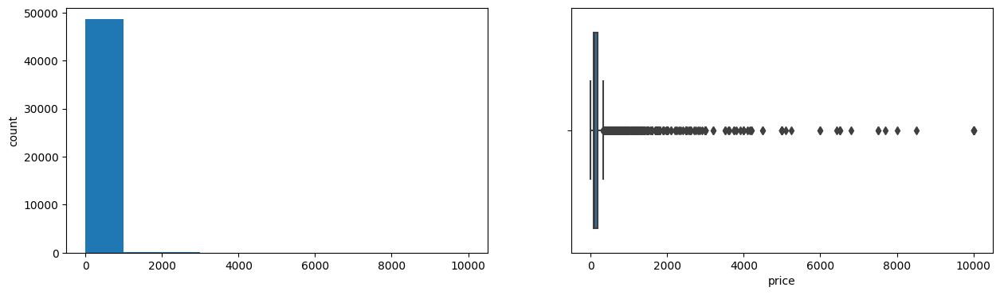

minimum_nights
Skew : 21.83


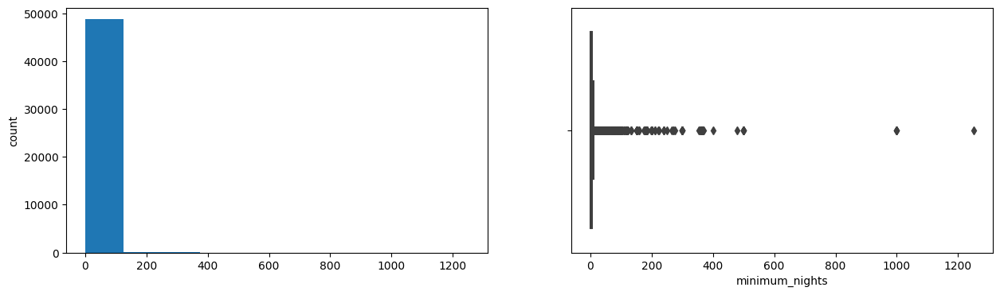

number_of_reviews
Skew : 3.69


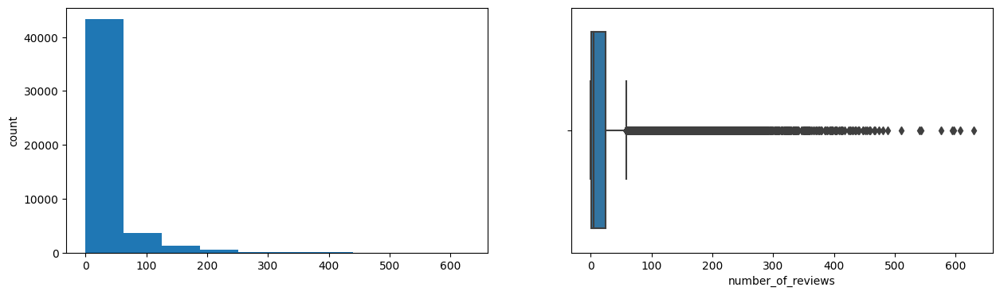

reviews_per_month
Skew : 3.13


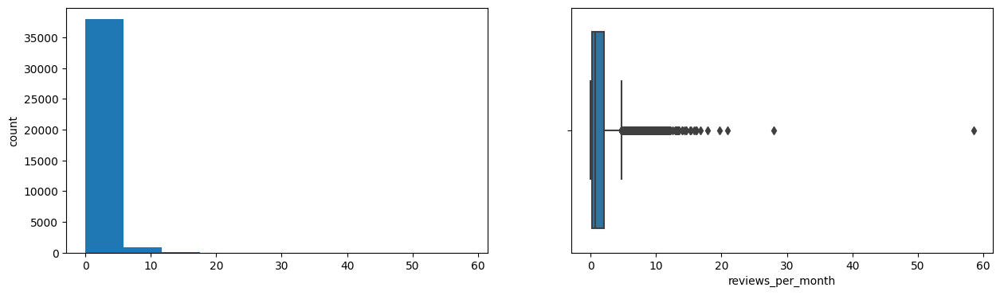

calculated_host_listings_count
Skew : 7.93


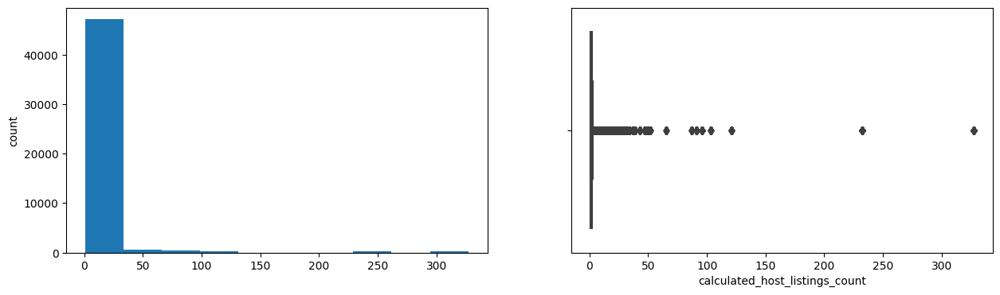

availability_365
Skew : 0.76


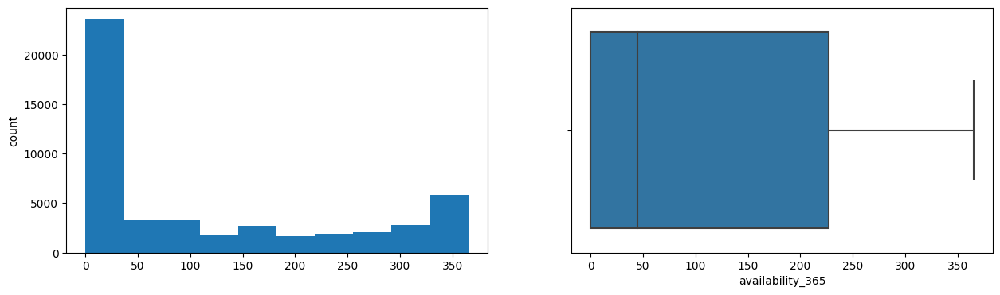

day_of_week
Skew : -0.15


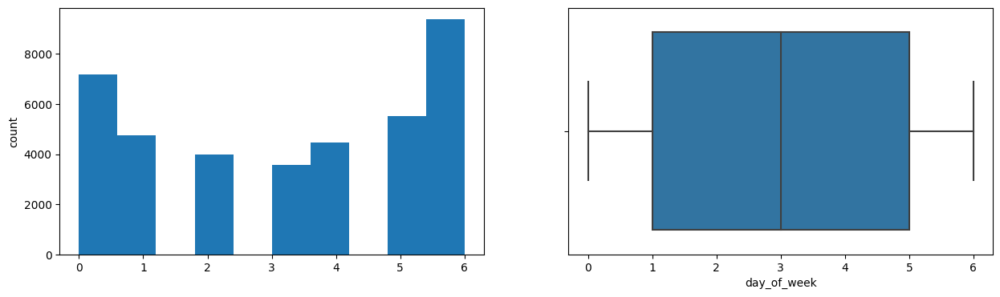

is_weekend
Skew : 0.0


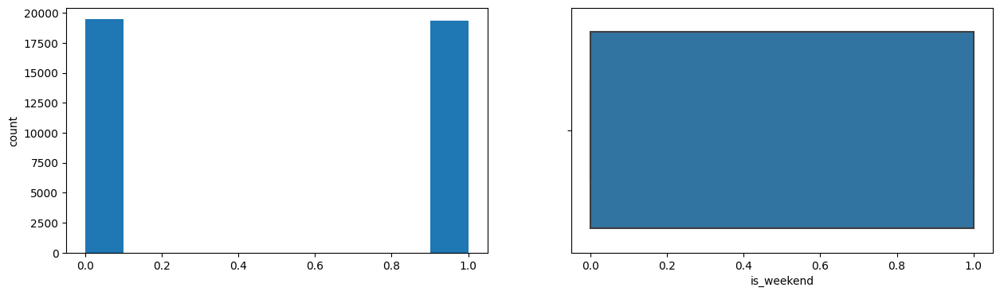

In [43]:
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()


In [44]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,4.0,1.0
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,1.0,0.0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaT,NaN,1,365,NaN,NaN
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,4.0,1.0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,0.0,0.0


In [45]:
#oda tipine göre minimum kalma sayısı
df.groupby('room_type').agg( {'minimum_nights': lambda minimum_nights: minimum_nights.sum()})

,minimum_nights
room_type,
Entire home/apt,216152
Private room,120067
Shared room,7511


In [46]:
#oda tipi ve bölgeye göre min kalma sayısı
df.groupby(['room_type', 'neighbourhood_group'])['minimum_nights'].count()#.sort_values(ascending=False)

room_type        neighbourhood_group
Entire home/apt  Bronx                    379
                 Brooklyn                9559
                 Manhattan              13199
                 Queens                  2096
                 Staten Island            176
Private room     Bronx                    652
                 Brooklyn               10132
                 Manhattan               7982
                 Queens                  3372
                 Staten Island            188
Shared room      Bronx                     60
                 Brooklyn                 413
                 Manhattan                480
                 Queens                   198
                 Staten Island              9
Name: minimum_nights, dtype: int64

In [47]:
#ilgili hostun toplam min kalma süreleri
df.groupby('host_id').agg({'minimum_nights': lambda minimum_nights: minimum_nights.sum()}).sort_values(by='minimum_nights', ascending=False).nlargest(10, 'minimum_nights')

,minimum_nights
host_id,
107434423,7470
219517861,4353
30283594,3767
137358866,3090
16098958,2880
12243051,2784
61391963,2760
22541573,2610
7245581,2328


In [48]:
df.loc[(df['host_id'] == 107434423)]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
26137,20845031,"Homey Midtown East 1BR w/ Gym, Doorman, near t...",107434423,Blueground,Manhattan,Kips Bay,40.74510,-73.97915,Entire home/apt,308,30,0,NaT,NaN,232,156,NaN,NaN
29128,22370388,"Calming FiDi 1BR w/ lux Gym, Speakeasy + Doorm...",107434423,Blueground,Manhattan,Financial District,40.70637,-74.00941,Entire home/apt,271,30,1,2018-08-17,0.09,232,310,4.0,1.0
30158,23264421,"Mod Midtown East 1BR w/ Gym, walk to Grand Cen...",107434423,Blueground,Manhattan,Murray Hill,40.74900,-73.97961,Entire home/apt,289,30,0,NaT,NaN,232,223,NaN,NaN
30428,23538486,"Posh Park Avenue 1BR w/ Gym, Doorman in Midtow...",107434423,Blueground,Manhattan,Murray Hill,40.74891,-73.97887,Entire home/apt,305,30,1,2019-01-15,0.17,232,326,1.0,0.0
31506,24535218,"Luxury Tribeca 1BR w/ Gym, Doorman + Roof deck...",107434423,Blueground,Manhattan,Tribeca,40.71433,-74.01073,Entire home/apt,323,30,0,NaT,NaN,232,316,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48723,36404684,Smart Nolita 1BR w/ W/D near famous cafes by B...,107434423,Blueground,Manhattan,Nolita,40.72283,-73.99472,Entire home/apt,316,30,0,NaT,NaN,232,325,NaN,NaN
48724,36404784,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76082,-73.99709,Entire home/apt,385,30,0,NaT,NaN,232,338,NaN,NaN
48725,36404815,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76083,-73.99727,Entire home/apt,267,30,0,NaT,NaN,232,228,NaN,NaN
48726,36404936,Beautiful Williamsburg 2BR w/ Skyline views + ...,107434423,Blueground,Brooklyn,Williamsburg,40.71493,-73.96365,Entire home/apt,278,30,0,NaT,NaN,232,188,NaN,NaN


In [49]:
#ev sahiplerine göre aylık yorum sayısı toplamı
df.groupby('host_id')['reviews_per_month'].sum().sort_values(ascending=False).head(10)

host_id
219517861    397.56
244361589    111.72
232251881     80.63
26432133      68.02
137274917     62.89
224414117     59.10
156948703     56.44
344035        56.00
156684502     54.38
37312959      53.53
Name: reviews_per_month, dtype: float64

In [50]:
# burada en yüksek fiyatlı evin hangi bölge ve oda tipinde olduğunu gözlemliyoruz
df.groupby(['neighbourhood_group','room_type'])['price'].mean().sort_values(ascending = False)


neighbourhood_group  room_type      
Manhattan            Entire home/apt    249.239109
Brooklyn             Entire home/apt    178.327545
Staten Island        Entire home/apt    173.846591
Queens               Entire home/apt    147.050573
Bronx                Entire home/apt    127.506596
Manhattan            Private room       116.776622
                     Shared room         88.977083
Brooklyn             Private room        76.500099
Queens               Private room        71.762456
                     Shared room         69.020202
Bronx                Private room        66.788344
Staten Island        Private room        62.292553
Bronx                Shared room         59.800000
Staten Island        Shared room         57.444444
Brooklyn             Shared room         50.527845
Name: price, dtype: float64

In [51]:
#index eklemek istersek
df.groupby(['neighbourhood_group','room_type'])['price'].mean().sort_values(ascending = False).reset_index()

,neighbourhood_group,room_type,price
0,Manhattan,Entire home/apt,249.239109
1,Brooklyn,Entire home/apt,178.327545
2,Staten Island,Entire home/apt,173.846591
3,Queens,Entire home/apt,147.050573
4,Bronx,Entire home/apt,127.506596
5,Manhattan,Private room,116.776622
6,Manhattan,Shared room,88.977083
7,Brooklyn,Private room,76.500099
8,Queens,Private room,71.762456
9,Queens,Shared room,69.020202


<AxesSubplot: xlabel='neighbourhood_group', ylabel='price'>

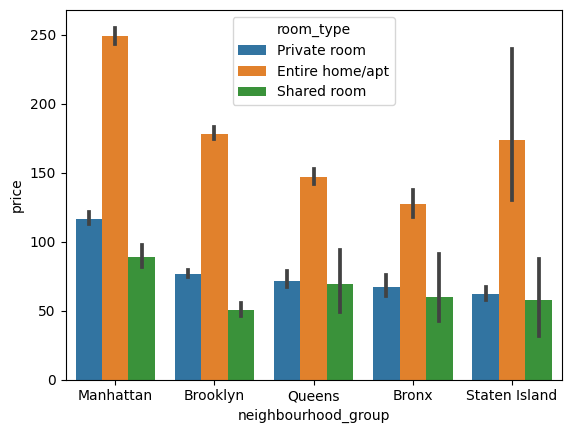

In [52]:
#bölge ve oda tipine göre ücretin görselleştirilmesi
sns.barplot(x ='neighbourhood_group',y = 'price' ,hue = 'room_type' ,data = df ,order = df.neighbourhood_group.value_counts().index)

In [53]:
#en çok bu hizmeti kullanan kullanıcı(ev sahibi) ve sayısı
top_host=df.host_id.value_counts().head(10)
top_host

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
12243051      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

In [54]:
#doğrulama işlemi için calculated_host_listings_count değişkeninin maximum değerini getiriyoruz.
top_host_check=df.calculated_host_listings_count.max()
top_host_check

327

In [55]:
top10_host = df.host_id.value_counts().head(10).index
top10_host

Int64Index([219517861, 107434423, 30283594, 137358866, 16098958, 12243051, 61391963, 22541573, 200380610, 7503643], dtype='int64')

In [56]:
top10_host_vis=df.loc[df['host_id'].isin(top10_host)]
top10_host_vis

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,day_of_week,is_weekend
2631,1390532,Amazing Designer Loft in BK Factory,7503643,Vida,Brooklyn,Greenpoint,40.72456,-73.94343,Entire home/apt,129,30,7,2019-03-27,0.11,52,189,2.0,0.0
2636,1392673,Spacious Factory Converted Loft,7503643,Vida,Brooklyn,Greenpoint,40.72756,-73.94230,Entire home/apt,129,30,6,2018-09-02,0.09,52,249,6.0,1.0
2708,1460017,Lovely Factory Loft in Greenpoint!,7503643,Vida,Brooklyn,Greenpoint,40.72732,-73.94076,Entire home/apt,129,30,6,2018-09-11,0.08,52,277,1.0,0.0
2749,1486099,All New Bohemian Chic 1BR Loft,7503643,Vida,Brooklyn,Greenpoint,40.72267,-73.94362,Entire home/apt,149,30,9,2018-02-18,0.13,52,343,6.0,1.0
2782,1524302,Huge 1 Bedroom Loft at Habitat 101!,7503643,Vida,Brooklyn,Greenpoint,40.72686,-73.94177,Entire home/apt,149,30,7,2018-10-31,0.11,52,281,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48723,36404684,Smart Nolita 1BR w/ W/D near famous cafes by B...,107434423,Blueground,Manhattan,Nolita,40.72283,-73.99472,Entire home/apt,316,30,0,NaT,NaN,232,325,NaN,NaN
48724,36404784,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76082,-73.99709,Entire home/apt,385,30,0,NaT,NaN,232,338,NaN,NaN
48725,36404815,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76083,-73.99727,Entire home/apt,267,30,0,NaT,NaN,232,228,NaN,NaN
48726,36404936,Beautiful Williamsburg 2BR w/ Skyline views + ...,107434423,Blueground,Brooklyn,Williamsburg,40.71493,-73.96365,Entire home/apt,278,30,0,NaT,NaN,232,188,NaN,NaN


Text(0, 0.5, 'Number of Airbnb')

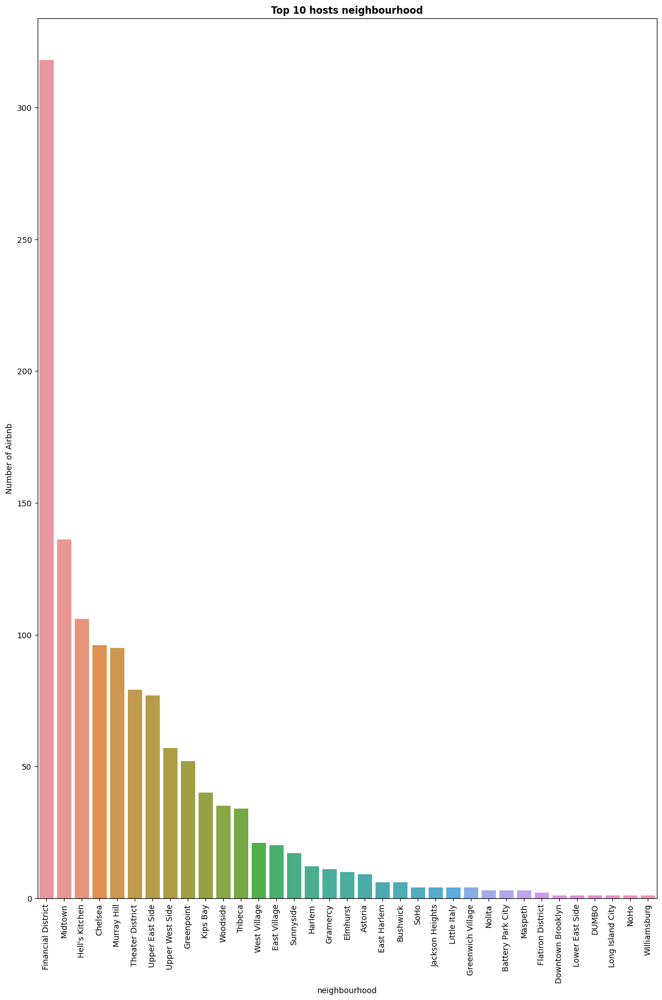

In [57]:
#Bu ilk 10 ev sahibinin mahalle bilgisi.
plt.figure(figsize=(14,20))
sns.countplot(data=top10_host_vis,x='neighbourhood',order = top10_host_vis['neighbourhood'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Top 10 hosts neighbourhood",weight='bold')
plt.ylabel('Number of Airbnb')

<AxesSubplot: >

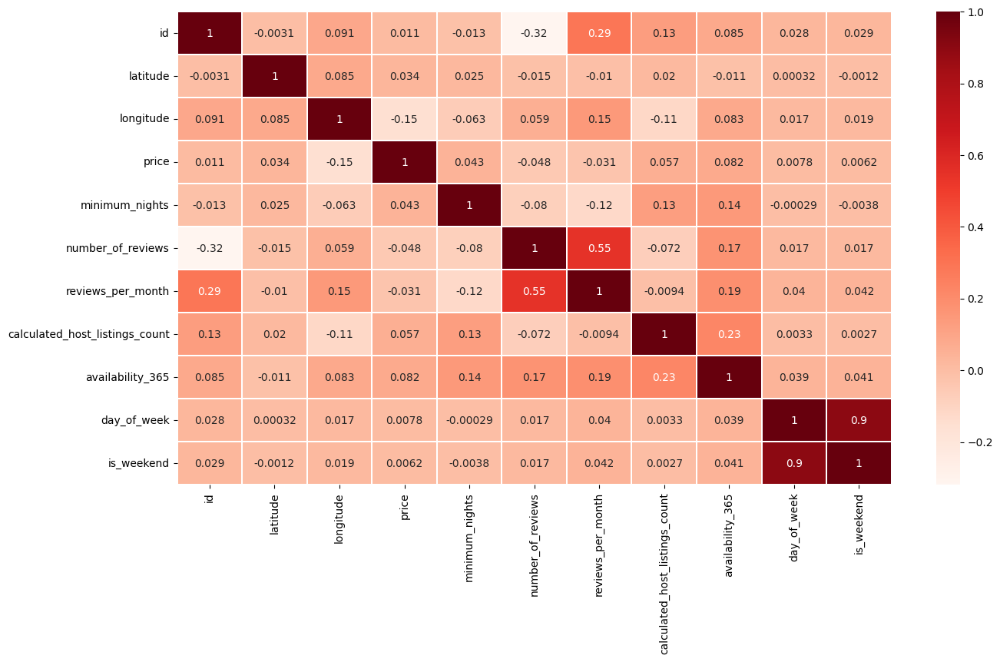

In [58]:
#Corrlation 
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot=True, linewidths=0.1, cmap='Reds')

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

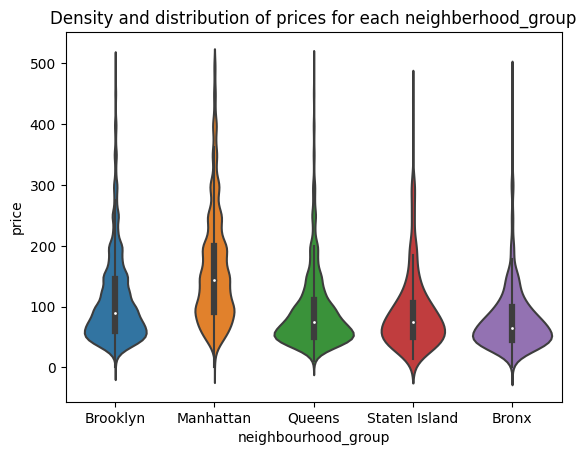

In [59]:
#yoğunluk ve dağılımı gözlemlemek için viyolin grafiği kullanabiliriz. 
#Burada aykırılıkları ve hangi bölgede yoğunlaşma olduğunu açıkça görebiliriz

#uç değerleri olmayan / 500'den az olan bir altküme 
sub_6=df[df.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

**Bonus**

In [60]:
#let's comeback now to the 'name' column as it will require litte bit more coding and continue to analyze it!

#initializing empty list where we are going to put our name strings
_names_=[]
#getting name strings from the column and appending it to the list
for name in df.name:
    _names_.append(name)
#setting a function that will split those name strings into separate words   
def split_name(name):
    spl=str(name).split()
    return spl
#initializing empty list where we are going to have words counted
_names_for_count_=[]
#getting name string from our list and using split function, later appending to list above
for x in _names_:
    for word in split_name(x):
        word=word.lower()
        _names_for_count_.append(word)

In [61]:
#we are going to use counter
from collections import Counter
#let's see top 25 used words by host to name their listing
_top_25_w=Counter(_names_for_count_).most_common()
_top_25_w=_top_25_w[0:25]

In [62]:
#now let's put our findings in dataframe for further visualizations
sub_w=pd.DataFrame(_top_25_w)
sub_w.rename(columns={0:'Words', 1:'Count'}, inplace=True)

[Text(0, 0, 'in'),
 Text(1, 0, 'room'),
 Text(2, 0, 'bedroom'),
 Text(3, 0, 'private'),
 Text(4, 0, 'apartment'),
 Text(5, 0, 'cozy'),
 Text(6, 0, 'the'),
 Text(7, 0, 'to'),
 Text(8, 0, 'studio'),
 Text(9, 0, 'brooklyn'),
 Text(10, 0, 'apt'),
 Text(11, 0, 'spacious'),
 Text(12, 0, '1'),
 Text(13, 0, 'with'),
 Text(14, 0, '2'),
 Text(15, 0, 'of'),
 Text(16, 0, 'east'),
 Text(17, 0, 'and'),
 Text(18, 0, 'manhattan'),
 Text(19, 0, '&'),
 Text(20, 0, 'park'),
 Text(21, 0, 'sunny'),
 Text(22, 0, 'beautiful'),
 Text(23, 0, 'near'),
 Text(24, 0, 'williamsburg')]

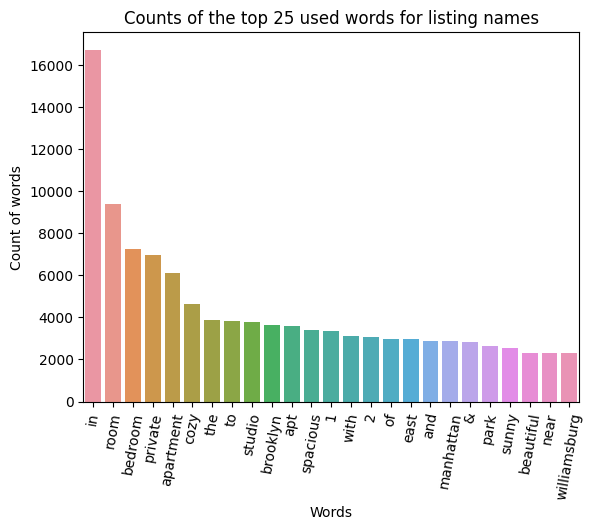

In [63]:
#we are going to use barplot for this visualization
viz_5=sns.barplot(x='Words', y='Count', data=sub_w)
viz_5.set_title('Counts of the top 25 used words for listing names')
viz_5.set_ylabel('Count of words')
viz_5.set_xlabel('Words')
viz_5.set_xticklabels(viz_5.get_xticklabels(), rotation=80)

En çok kullanılan 25 listenin ad kelimesini bulup bunların üzerinden geçtiğimizi gözlemleyebiliriz - net bir eğilim görebiliriz. Ev sahiplerinin, potansiyel bir gezgin tarafından daha kolay aranabilmesi için kayıtlarını çok özel terimlerle kısa bir biçimde açıkladıklarını gösterir. Bu tür kelimeler 'oda', 'yatak odası', 'özel', 'daire', 'stüdyo'dur. Bu, isimler için kullanılan herhangi bir slogan veya 'popüler/trend' terimi olmadığını gösterir; ev sahipleri, kaydın bulunduğu alanı ve alanı tanımlayan çok basit terimler kullanır. Çok dilli müşterilerle uğraşmak zor olabileceğinden ve kesinlikle alanınızı mümkün olduğunca kısa ve anlaşılır bir biçimde anlatmak istediğinizden, bu tekniğin biraz beklendiği görülmüştür.

In [64]:
df['name'].head()

0                  Clean & quiet apt home by the park
1                               Skylit Midtown Castle
2                 THE VILLAGE OF HARLEM....NEW YORK !
3                     Cozy Entire Floor of Brownstone
4    Entire Apt: Spacious Studio/Loft by central park
Name: name, dtype: object

In [65]:
!pip install textblob

In [66]:
!pip install wordcloud

In [67]:
from PIL import Image
from textblob import Word, TextBlob
from wordcloud import WordCloud

In [68]:
str(df['name'])

"0                       Clean & quiet apt home by the park\n1                                    Skylit Midtown Castle\n2                      THE VILLAGE OF HARLEM....NEW YORK !\n3                          Cozy Entire Floor of Brownstone\n4         Entire Apt: Spacious Studio/Loft by central park\n                               ...                        \n48890      Charming one bedroom - newly renovated rowhouse\n48891        Affordable room in Bushwick/East Williamsburg\n48892              Sunny Studio at Historical Neighborhood\n48893                 43rd St. Time Square-cozy single bed\n48894    Trendy duplex in the very heart of Hell's Kitchen\nName: name, Length: 48895, dtype: object"

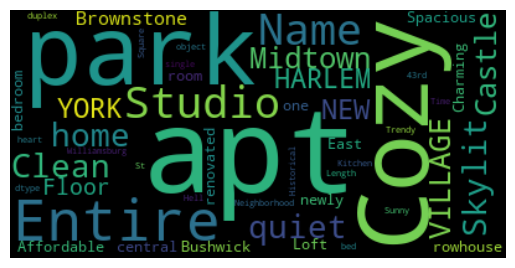

In [69]:

#kelime bulutu
wordcloud = WordCloud().generate(str(df['name']))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


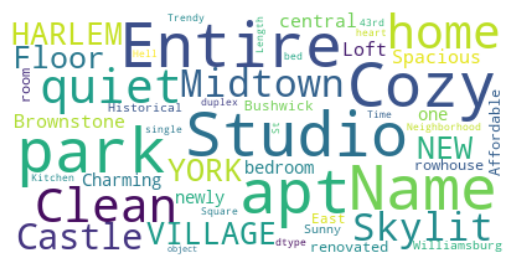

In [70]:
wordcloud = WordCloud(max_font_size=50, #max büyüklük font 50
                      max_words=100, #max kelime sayısı 100
                      background_color="white").generate(str(df['name'])) #arkaplan beyaz

plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [71]:
#wordcloud.to_file("wordcloud.png")